<a href="https://colab.research.google.com/github/Manogna-Bedadakota/UNP_Capstone_Projects/blob/main/Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PPT

https://docs.google.com/presentation/d/1COJWIop5g3-4BFiDdmx_qmgScvRzDRNb/edit?usp=sharing&ouid=107935653525661581940&rtpof=true&sd=true

# IMPORT STATEMENTS

In [ ]:
# preprocessing and eda
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from bokeh.plotting import figure, output_notebook, show

# splitting the dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# vif
from statsmodels.stats.outliers_influence import variance_inflation_factor

# decision tree
from sklearn.tree import DecisionTreeRegressor

# support vector regressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

# k neighbours regressor (5 neighbours)
from sklearn.neighbors import KNeighborsRegressor

# linear regression
from sklearn.linear_model import LinearRegression

# gradient boost
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# xg boost
import xgboost as xg

# neural network
import tensorflow as tf
from tensorflow.keras import models, layers, utils

# READING DATASET



In [ ]:
data = pd.read_excel("/content/regression_dataset.xlsx")
data

,Lever position,Ship speed,Gas Turbine (GT) shaft torque,GT rate of revolutions,Gas Generator rate of revolutions,Starboard Propeller Torque,Port Propeller Torque,Hight Pressure (HP) Turbine exit temperature,GT Compressor inlet air temperature,GT Compressor outlet air temperature,HP Turbine exit pressure,GT Compressor inlet air pressure,GT Compressor outlet air pressure,GT exhaust gas pressure,Turbine Injecton Control,Fuel flow,GT Compressor decay state coefficient,GT Turbine decay state coefficient
0,1.138,3,289.964,1349.489,6677.380,7.584,7.584,464.006,288,550.563,1.096,0.998,5.947,1.019,7.137,0.082,0.95,0.975
1,2.088,6,6960.180,1376.166,6828.469,28.204,28.204,635.401,288,581.658,1.331,0.998,7.282,1.019,10.655,0.287,0.95,0.975
2,3.144,9,8379.229,1386.757,7111.811,60.358,60.358,606.002,288,587.587,1.389,0.998,7.574,1.020,13.086,0.259,0.95,0.975
3,4.161,12,14724.395,1547.465,7792.630,113.774,113.774,661.471,288,613.851,1.658,0.998,9.007,1.022,18.109,0.358,0.95,0.975
4,5.140,15,21636.432,1924.313,8494.777,175.306,175.306,731.494,288,645.642,2.078,0.998,11.197,1.026,26.373,0.522,0.95,0.975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11929,5.140,15,21624.934,1924.342,8470.013,175.239,175.239,681.658,288,628.950,2.087,0.998,10.990,1.027,23.803,0.471,1.00,1.000
11930,6.175,18,29763.213,2306.745,8800.352,245.954,245.954,747.405,288,658.853,2.512,0.998,13.109,1.031,32.671,0.647,1.00,1.000
11931,7.148,21,39003.867,2678.052,9120.889,332.389,332.389,796.457,288,680.393,2.982,0.998,15.420,1.036,42.104,0.834,1.00,1.000
11932,8.206,24,50992.579,3087.434,9300.274,438.024,438.024,892.945,288,722.029,3.594,0.998,18.293,1.043,58.064,1.149,1.00,1.000


# CLEANING

In [ ]:
null_count = data.isnull().sum()
print (null_count)

Lever position                                  0
Ship speed                                      0
Gas Turbine (GT) shaft torque                   0
GT rate of revolutions                          0
Gas Generator rate of revolutions               0
Starboard Propeller Torque                      0
Port Propeller Torque                           0
Hight Pressure (HP) Turbine exit temperature    0
GT Compressor inlet air temperature             0
GT Compressor outlet air temperature            0
HP Turbine exit pressure                        0
GT Compressor inlet air pressure                0
GT Compressor outlet air pressure               0
GT exhaust gas pressure                         0
Turbine Injecton Control                        0
Fuel flow                                       0
GT Compressor decay state coefficient           0
GT Turbine decay state coefficient              0
dtype: int64


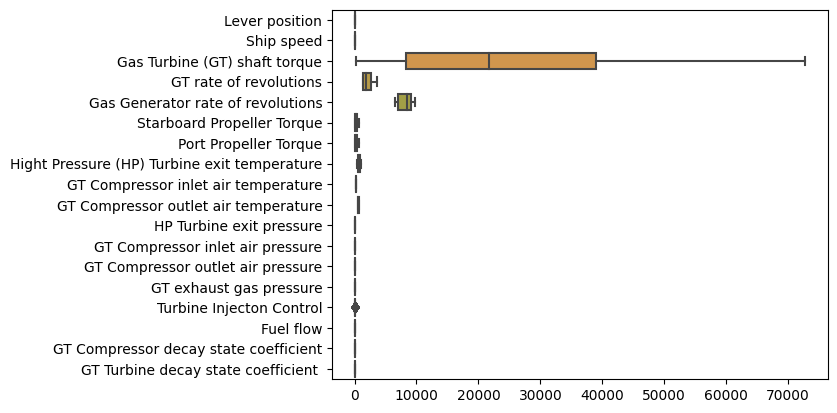

In [ ]:
sns.boxplot(data = data, orient = 'h')
plt.show()

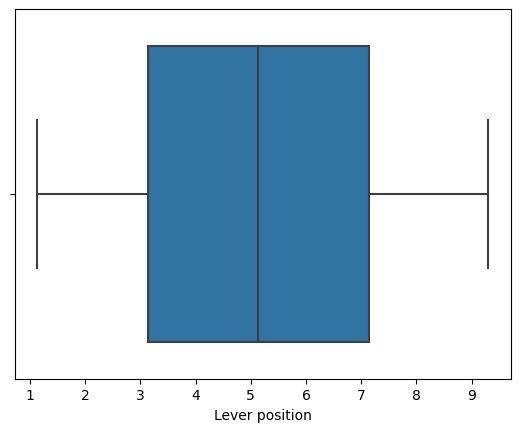

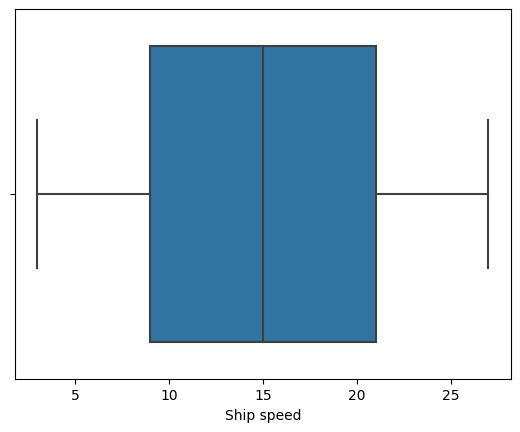

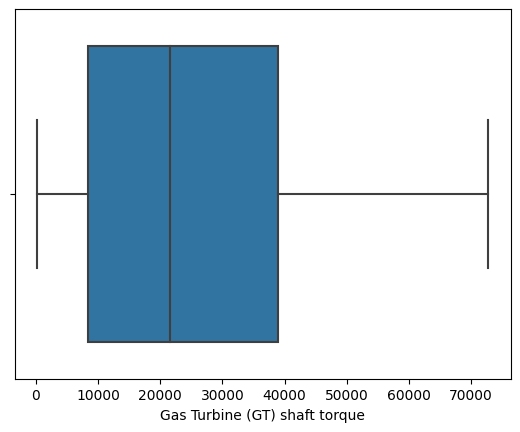

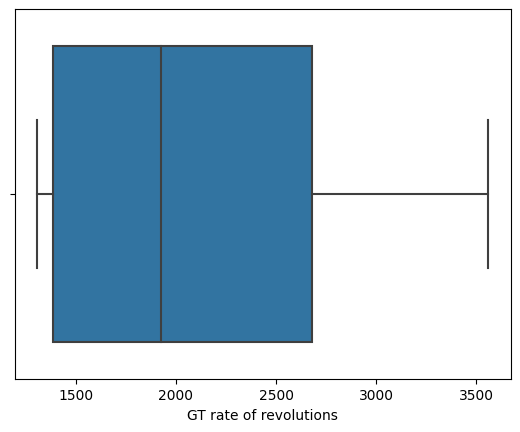

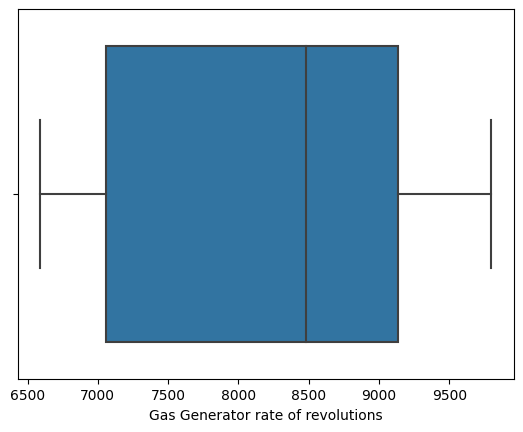

...

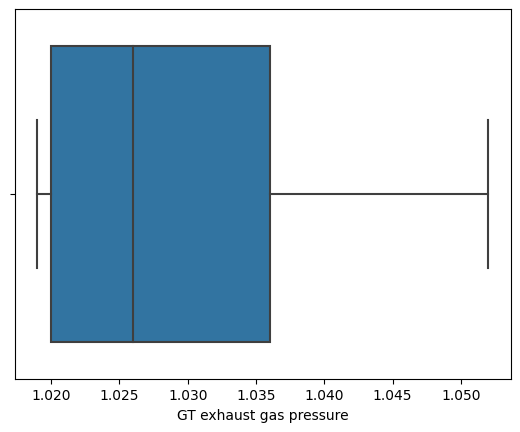

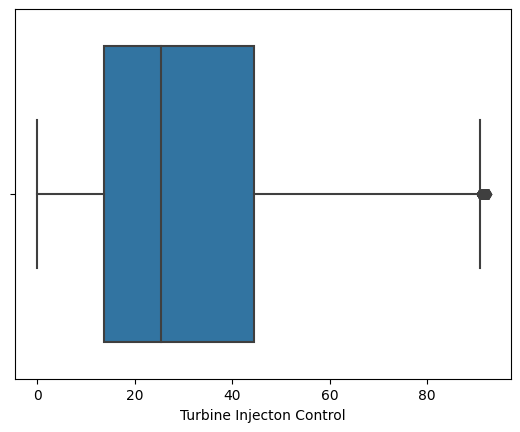

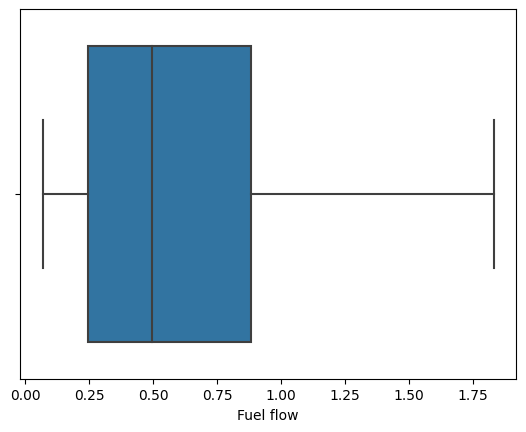

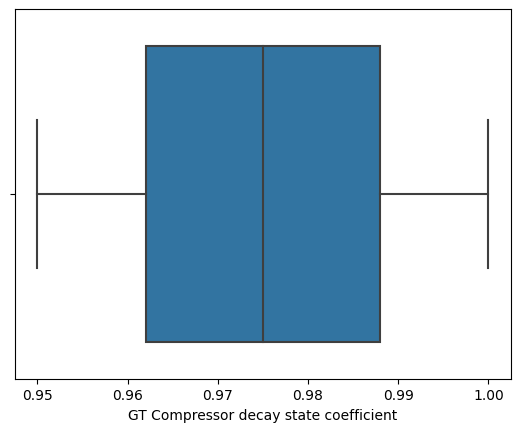

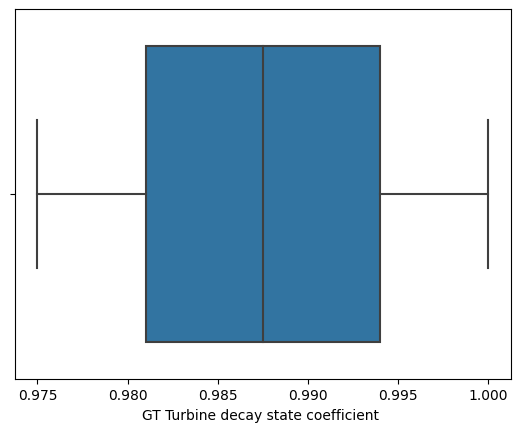

In [ ]:
col = data.columns.tolist()
for i in col:
    sns.boxplot(data = data, x = i)
    plt.show()

In [ ]:
def rem_outliers(data, lim= 85):
    outliers = ((data['Turbine Injecton Control'] > lim))
    out_data = data[outliers]
    new_data = data[~outliers]
    return out_data, new_data

out_data, new_data = rem_outliers(data, lim = 85)

In [ ]:
#ENTIRE DATASET
data

,Lever position,Ship speed,Gas Turbine (GT) shaft torque,GT rate of revolutions,Gas Generator rate of revolutions,Starboard Propeller Torque,Port Propeller Torque,Hight Pressure (HP) Turbine exit temperature,GT Compressor inlet air temperature,GT Compressor outlet air temperature,HP Turbine exit pressure,GT Compressor inlet air pressure,GT Compressor outlet air pressure,GT exhaust gas pressure,Turbine Injecton Control,Fuel flow,GT Compressor decay state coefficient,GT Turbine decay state coefficient
0,1.138,3,289.964,1349.489,6677.380,7.584,7.584,464.006,288,550.563,1.096,0.998,5.947,1.019,7.137,0.082,0.95,0.975
1,2.088,6,6960.180,1376.166,6828.469,28.204,28.204,635.401,288,581.658,1.331,0.998,7.282,1.019,10.655,0.287,0.95,0.975
2,3.144,9,8379.229,1386.757,7111.811,60.358,60.358,606.002,288,587.587,1.389,0.998,7.574,1.020,13.086,0.259,0.95,0.975
3,4.161,12,14724.395,1547.465,7792.630,113.774,113.774,661.471,288,613.851,1.658,0.998,9.007,1.022,18.109,0.358,0.95,0.975
4,5.140,15,21636.432,1924.313,8494.777,175.306,175.306,731.494,288,645.642,2.078,0.998,11.197,1.026,26.373,0.522,0.95,0.975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11929,5.140,15,21624.934,1924.342,8470.013,175.239,175.239,681.658,288,628.950,2.087,0.998,10.990,1.027,23.803,0.471,1.00,1.000
11930,6.175,18,29763.213,2306.745,8800.352,245.954,245.954,747.405,288,658.853,2.512,0.998,13.109,1.031,32.671,0.647,1.00,1.000
11931,7.148,21,39003.867,2678.052,9120.889,332.389,332.389,796.457,288,680.393,2.982,0.998,15.420,1.036,42.104,0.834,1.00,1.000
11932,8.206,24,50992.579,3087.434,9300.274,438.024,438.024,892.945,288,722.029,3.594,0.998,18.293,1.043,58.064,1.149,1.00,1.000


In [ ]:
#WITHOUT OUTLIERS
new_data

,Lever position,Ship speed,Gas Turbine (GT) shaft torque,GT rate of revolutions,Gas Generator rate of revolutions,Starboard Propeller Torque,Port Propeller Torque,Hight Pressure (HP) Turbine exit temperature,GT Compressor inlet air temperature,GT Compressor outlet air temperature,HP Turbine exit pressure,GT Compressor inlet air pressure,GT Compressor outlet air pressure,GT exhaust gas pressure,Turbine Injecton Control,Fuel flow,GT Compressor decay state coefficient,GT Turbine decay state coefficient
0,1.138,3,289.964,1349.489,6677.380,7.584,7.584,464.006,288,550.563,1.096,0.998,5.947,1.019,7.137,0.082,0.95,0.975
1,2.088,6,6960.180,1376.166,6828.469,28.204,28.204,635.401,288,581.658,1.331,0.998,7.282,1.019,10.655,0.287,0.95,0.975
2,3.144,9,8379.229,1386.757,7111.811,60.358,60.358,606.002,288,587.587,1.389,0.998,7.574,1.020,13.086,0.259,0.95,0.975
3,4.161,12,14724.395,1547.465,7792.630,113.774,113.774,661.471,288,613.851,1.658,0.998,9.007,1.022,18.109,0.358,0.95,0.975
4,5.140,15,21636.432,1924.313,8494.777,175.306,175.306,731.494,288,645.642,2.078,0.998,11.197,1.026,26.373,0.522,0.95,0.975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11928,4.161,12,14718.321,1547.453,7729.639,113.743,113.743,617.242,288,599.109,1.663,0.998,8.830,1.023,16.151,0.320,1.00,1.000
11929,5.140,15,21624.934,1924.342,8470.013,175.239,175.239,681.658,288,628.950,2.087,0.998,10.990,1.027,23.803,0.471,1.00,1.000
11930,6.175,18,29763.213,2306.745,8800.352,245.954,245.954,747.405,288,658.853,2.512,0.998,13.109,1.031,32.671,0.647,1.00,1.000
11931,7.148,21,39003.867,2678.052,9120.889,332.389,332.389,796.457,288,680.393,2.982,0.998,15.420,1.036,42.104,0.834,1.00,1.000


In [ ]:
#ONLY OUTLIERS
out_data

,Lever position,Ship speed,Gas Turbine (GT) shaft torque,GT rate of revolutions,Gas Generator rate of revolutions,Starboard Propeller Torque,Port Propeller Torque,Hight Pressure (HP) Turbine exit temperature,GT Compressor inlet air temperature,GT Compressor outlet air temperature,HP Turbine exit pressure,GT Compressor inlet air pressure,GT Compressor outlet air pressure,GT exhaust gas pressure,Turbine Injecton Control,Fuel flow,GT Compressor decay state coefficient,GT Turbine decay state coefficient
8,9.3,27,72763.329,3560.395,9778.528,644.905,644.905,1115.797,288,789.094,4.498,0.998,22.811,1.049,92.556,1.832,0.95,0.975
17,9.3,27,72763.515,3560.401,9779.311,644.963,644.963,1114.887,288,788.949,4.496,0.998,22.784,1.049,92.448,1.830,0.95,0.976
26,9.3,27,72764.565,3560.403,9780.103,645.076,645.076,1113.985,288,788.806,4.495,0.998,22.756,1.049,92.342,1.828,0.95,0.977
35,9.3,27,72765.436,3560.405,9780.887,645.040,645.040,1113.084,288,788.664,4.494,0.998,22.729,1.049,92.235,1.826,0.95,0.978
44,9.3,27,72766.645,3560.405,9781.672,644.879,644.879,1112.188,288,788.523,4.493,0.998,22.701,1.049,92.129,1.824,0.95,0.979
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11897,9.3,27,72771.257,3560.398,9739.462,644.847,644.847,1041.768,288,768.194,4.535,0.998,22.570,1.052,86.476,1.712,1.00,0.996
11906,9.3,27,72772.186,3560.399,9740.340,644.841,644.841,1040.925,288,768.043,4.534,0.998,22.544,1.052,86.373,1.710,1.00,0.997
11915,9.3,27,72774.127,3560.388,9741.225,644.927,644.927,1040.089,288,767.894,4.533,0.998,22.517,1.052,86.272,1.708,1.00,0.998
11924,9.3,27,72773.934,3560.398,9742.081,644.843,644.843,1039.245,288,767.743,4.532,0.998,22.491,1.052,86.168,1.706,1.00,0.999


In [ ]:
dup = new_data[new_data.duplicated(keep = False)]
dup.sum()

Lever position                                  0.0
Ship speed                                      0.0
Gas Turbine (GT) shaft torque                   0.0
GT rate of revolutions                          0.0
Gas Generator rate of revolutions               0.0
Starboard Propeller Torque                      0.0
Port Propeller Torque                           0.0
Hight Pressure (HP) Turbine exit temperature    0.0
GT Compressor inlet air temperature             0.0
GT Compressor outlet air temperature            0.0
HP Turbine exit pressure                        0.0
GT Compressor inlet air pressure                0.0
GT Compressor outlet air pressure               0.0
GT exhaust gas pressure                         0.0
Turbine Injecton Control                        0.0
Fuel flow                                       0.0
GT Compressor decay state coefficient           0.0
GT Turbine decay state coefficient              0.0
dtype: float64

In [ ]:
new_data.describe()

,Lever position,Ship speed,Gas Turbine (GT) shaft torque,GT rate of revolutions,Gas Generator rate of revolutions,Starboard Propeller Torque,Port Propeller Torque,Hight Pressure (HP) Turbine exit temperature,GT Compressor inlet air temperature,GT Compressor outlet air temperature,HP Turbine exit pressure,GT Compressor inlet air pressure,GT Compressor outlet air pressure,GT exhaust gas pressure,Turbine Injecton Control,Fuel flow,GT Compressor decay state coefficient,GT Turbine decay state coefficient
count,10608.000000,10608.000000,10608.000000,10608.000000,10608.000000,10608.000000,10608.000000,10608.000000,10608.0,10608.000000,10608.000000,10608.000,10608.000000,10608.000000,10608.000000,10608.000000,10608.00000,10608.0000
mean,4.650000,13.500000,21557.252864,1958.274908,8006.109748,175.136464,175.136464,692.888116,288.0,629.706905,2.082861,0.998,11.004863,1.026867,26.685687,0.524313,0.97500,0.9875
std,2.314629,6.874188,16138.445471,623.606275,999.063663,143.870360,143.870360,132.503278,0.0,59.038047,0.816774,0.000,4.124635,0.007757,17.763855,0.342801,0.01472,0.0075
min,1.138000,3.000000,253.547000,1307.675000,6589.002000,5.304000,5.304000,442.364000,288.0,540.442000,1.093000,0.998,5.828000,1.019000,0.000000,0.068000,0.95000,0.9750
25%,2.880000,8.250000,8144.121500,1386.750000,6968.857500,53.128750,53.128750,584.813250,288.0,575.832250,1.373500,0.998,7.369500,1.020000,12.560000,0.242000,0.96200,0.9810
50%,4.650500,13.500000,18173.511500,1735.891500,8145.647500,144.498500,144.498500,679.186000,288.0,621.400500,1.869500,0.998,9.985000,1.024500,24.493500,0.414500,0.97500,0.9875
75%,6.418250,18.750000,32092.448500,2400.137250,8917.739500,267.796250,267.796250,798.350750,288.0,677.396000,2.627000,0.998,13.899500,1.032000,37.346000,0.739500,0.98800,0.9940
max,8.206000,24.000000,50998.096000,3087.637000,9327.756000,438.149000,438.149000,952.122000,288.0,741.770000,3.612000,0.998,18.802000,1.043000,62.440000,1.236000,1.00000,1.0000


# HEATMAP




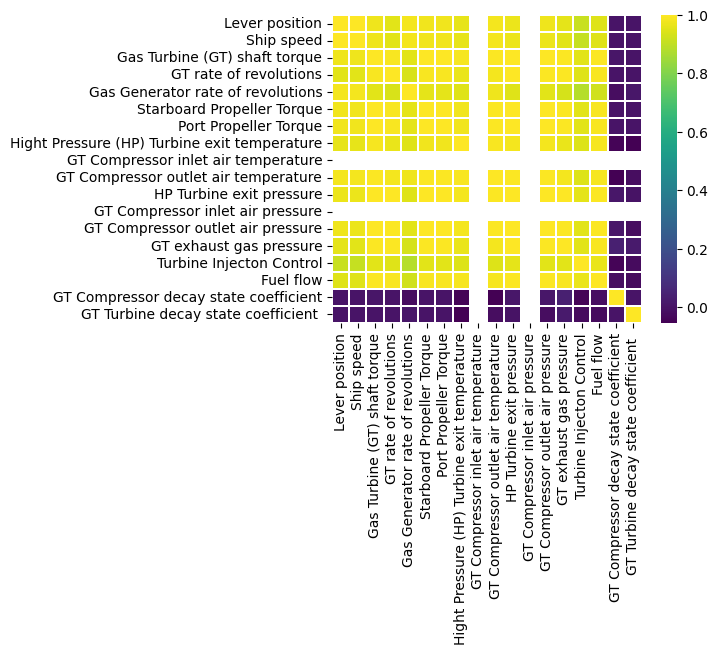

In [ ]:
corr_mat = new_data.corr()

plt.figure(figsize=(5, 4))
sns.heatmap(corr_mat,  annot=False, linewidths=0.01, linecolor = 'white', cmap = 'viridis')
plt.show()

# VISUALIZATIONS

In [ ]:
target_var = ['GT Compressor decay state coefficient', 'GT Turbine decay state coefficient ']

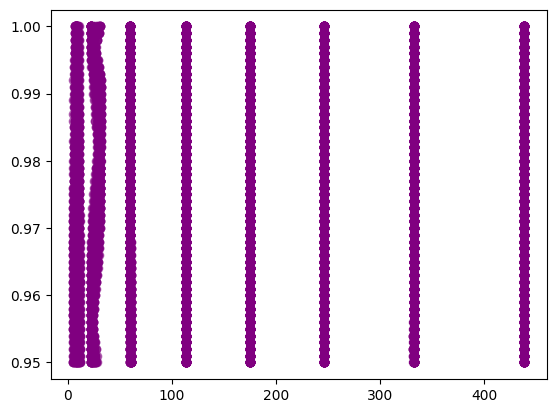

<Figure size 500x400 with 0 Axes>

In [ ]:
plt.scatter(new_data['Starboard Propeller Torque'], new_data['GT Compressor decay state coefficient'], color = 'purple', alpha = 0.5)
plt.figure(figsize=(5, 4))
plt.show()

In [ ]:
p = figure(title = 'revolutions vs. torque')
p.line(x = 'Lever position', y = 'Ship speed', source = new_data, line_width = 1.2, line_color = 'brown')
plt.figure(figsize=(5, 4))
output_notebook()
show(p)

<Figure size 500x400 with 0 Axes>

In [ ]:
unq1 = new_data['GT Compressor decay state coefficient'].nunique()
print(unq1)
unq2 = new_data['GT Turbine decay state coefficient '].nunique()
print(unq2)

51
26


In [ ]:
p = figure(title = 'temperature vs. fuel flow')
p.line(x = 'GT Compressor outlet air temperature', y = 'Fuel flow', source = new_data, line_width = 1.2, line_color = 'green')
plt.figure(figsize=(5, 4))
output_notebook()
show(p)

<Figure size 500x400 with 0 Axes>

In [ ]:
p = figure(title = 'pressure vs. fuel flow')
p.line(x = 'GT Compressor outlet air pressure', y = 'Fuel flow', source = new_data, line_width = 1.2, line_color = 'pink')
plt.figure(figsize=(5, 4))
output_notebook()
show(p)

<Figure size 500x400 with 0 Axes>

In [ ]:
p = figure(title = 'torque vs. decay coefficient')
p.line(x = 'Gas Turbine (GT) shaft torque', y = 'GT rate of revolutions', source = new_data, line_width = 1.2, line_color = 'red')
plt.figure(figsize=(5, 4))
output_notebook()
show(p)

<Figure size 500x400 with 0 Axes>

In [ ]:
p = figure(title = 'lever psn vs. rate of revolutions')
p.line(x = 'Lever position', y = 'GT rate of revolutions', source = new_data, line_width = 1.2, line_color = 'lavender')
plt.figure(figsize=(5, 4))
output_notebook()
show(p)

<Figure size 500x400 with 0 Axes>

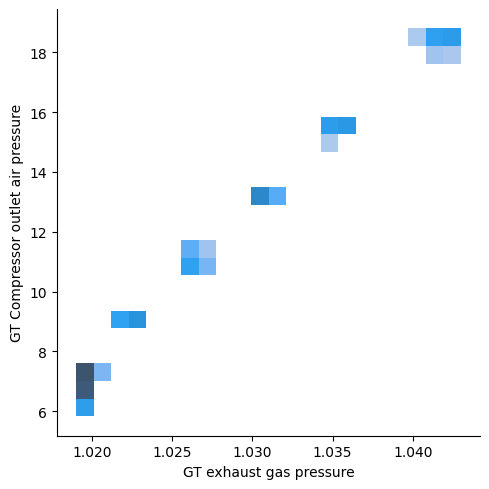

In [ ]:
sns.displot(new_data, x = 'GT exhaust gas pressure', y = 'GT Compressor outlet air pressure')

# SPLITTING DATASET

In [ ]:
x = new_data.drop(['GT Compressor decay state coefficient', 'GT Turbine decay state coefficient ', 'Port Propeller Torque',
                   'GT Compressor inlet air temperature', 'GT Compressor inlet air pressure'], axis=1)
y = new_data['GT Compressor decay state coefficient']

x1_train, x1_test, y1_train, y1_test = train_test_split(x, y, test_size = 0.3, random_state = 1)

x2_train, x2_test, y2_train, y2_test = train_test_split(x, y, test_size = 0.25, random_state = 1)

x3_train, x3_test, y3_train, y3_test = train_test_split(x, y, test_size = 0.2, random_state = 1)

In [ ]:
x1_train.shape, x1_test.shape

((7425, 13), (3183, 13))

In [ ]:
x2_train.shape, x2_test.shape

((7956, 13), (2652, 13))

In [ ]:
x3_train.shape, x3_test.shape

((8486, 13), (2122, 13))

# VIF

In [ ]:
def calculatevif(x):

    vif = pd.DataFrame()
    vif['VARIABLES'] = x.columns
    vif['VIF'] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    return(vif)

vif = calculatevif(x)
print(vif)

                                       VARIABLES           VIF
0                                 Lever position  3.412159e+05
1                                     Ship speed  2.889466e+05
2                  Gas Turbine (GT) shaft torque  6.450279e+04
3                         GT rate of revolutions  3.001520e+04
4              Gas Generator rate of revolutions  9.843502e+04
5                     Starboard Propeller Torque  5.734227e+04
6   Hight Pressure (HP) Turbine exit temperature  1.467546e+05
7           GT Compressor outlet air temperature  1.126406e+06
8                       HP Turbine exit pressure  1.689188e+05
9              GT Compressor outlet air pressure  1.204855e+05
10                       GT exhaust gas pressure  3.121826e+05
11                      Turbine Injecton Control  2.292302e+02
12                                     Fuel flow  4.397066e+04


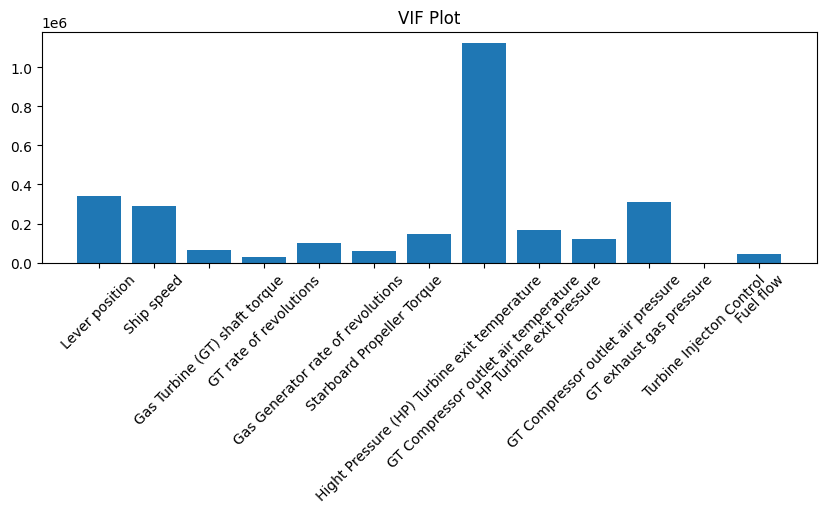

In [ ]:
plt.figure(figsize = (10, 3))
plt.bar(vif['VARIABLES'], vif['VIF'])
plt.title("VIF Plot")
plt.xticks(rotation=45)
plt.show()

# REGRESSION ALGORITHMS

DECISION TREE REGRESSOR

In [ ]:
desmse = []

def decisiontree(a, b, c, d):
    destree = DecisionTreeRegressor()
    destree.fit(a, c)
    y_pred = destree.predict(b)
    mse = round(mean_squared_error(d, y_pred),6)
    desmse.append(mse)
    return mse

err = decisiontree(x1_train, x1_test, y1_train, y1_test)
print('MEAN SQUARED ERROR OF SPLIT 1:', err)

err = decisiontree(x2_train, x2_test, y2_train, y2_test)
print('MEAN SQUARED ERROR OF SPLIT 2:', err)

err = decisiontree(x3_train, x3_test, y3_train, y3_test)
print('MEAN SQUARED ERROR OF SPLIT 3:', err)


SUPPORT VECTOR REGRESSOR

In [ ]:
svrmse = []

def supportvector(a, b, c, d):
    svreg = SVR(kernel='linear')
    svreg.fit(a, c.ravel())
    y_pred = svreg.predict(b)
    mse = round(mean_squared_error(d, y_pred),6)
    svrmse.append(mse)
    return mse

err = supportvector(x1_train, x1_test, y1_train, y1_test)
print('MEAN SQUARED ERROR OF SPLIT 1:', err)

err = supportvector(x2_train, x2_test, y2_train, y2_test)
print('MEAN SQUARED ERROR OF SPLIT 2:', err)

err = supportvector(x3_train, x3_test, y3_train, y3_test)
print('MEAN SQUARED ERROR OF SPLIT 3:', err)

K NEIGHBORS REGRESSOR

In [ ]:
knmse = []

def knregress(a, b, c, d):
    knreg = KNeighborsRegressor(n_neighbors=5)
    knreg.fit(a, c)
    y_pred = knreg.predict(b)
    mse = round(mean_squared_error(d, y_pred),6)
    knmse.append(mse)
    return mse

err = knregress(x1_train, x1_test, y1_train, y1_test)
print('MEAN SQUARED ERROR OF SPLIT 1:', err)

err = knregress(x2_train, x2_test, y2_train, y2_test)
print('MEAN SQUARED ERROR OF SPLIT 2:', err)

err = knregress(x3_train, x3_test, y3_train, y3_test)
print('MEAN SQUARED ERROR OF SPLIT 3:', err)

LINEAR REGRESSION

In [ ]:
lnrmse = []

def lnregress(a, b, c, d):
    lnrreg = LinearRegression()
    lnrreg.fit(a, c)
    y_pred = lnrreg.predict(b)
    mse = round(mean_squared_error(d, y_pred),6)
    lnrmse.append(mse)
    return mse

err = lnregress(x1_train, x1_test, y1_train, y1_test)
print('MEAN SQUARED ERROR OF SPLIT 1:', err)

err = lnregress(x2_train, x2_test, y2_train, y2_test)
print('MEAN SQUARED ERROR OF SPLIT 2:', err)

err = lnregress(x3_train, x3_test, y3_train, y3_test)
print('MEAN SQUARED ERROR OF SPLIT 3:', err)

GRADIENT BOOST

In [ ]:
gbmse = []

def gradboost(a, b, c, d):
    gbreg = GradientBoostingRegressor(n_estimators = 20)
    gbreg.fit(a, c)
    y_pred = gbreg.predict(b)
    mse = round(mean_squared_error(d, y_pred),6)
    gbmse.append(mse)
    return mse

err = gradboost(x1_train, x1_test, y1_train, y1_test)
print('MEAN SQUARED ERROR OF SPLIT 1:', err)

err = gradboost(x2_train, x2_test, y2_train, y2_test)
print('MEAN SQUARED ERROR OF SPLIT 2:', err)

err = gradboost(x3_train, x3_test, y3_train, y3_test)
print('MEAN SQUARED ERROR OF SPLIT 3:', err)

RANDOM FOREST

In [ ]:
rfmse = []

def rfregress(a, b, c, d):
    rfreg = RandomForestRegressor(n_estimators = 20)
    rfreg.fit(a, c)
    y_pred = rfreg.predict(b)
    mse = round(mean_squared_error(d, y_pred),6)
    rfmse.append(mse)
    return mse

err = rfregress(x1_train, x1_test, y1_train, y1_test)
print('MEAN SQUARED ERROR OF SPLIT 1:', err)

err = rfregress(x2_train, x2_test, y2_train, y2_test)
print('MEAN SQUARED ERROR OF SPLIT 2:', err)

err = rfregress(x3_train, x3_test, y3_train, y3_test)
print('MEAN SQUARED ERROR OF SPLIT 3:', err)

XG BOOST

In [ ]:
xgmse = []

def xgregress(a, b, c, d):
    xgreg = xg.XGBRegressor(objective ='reg:linear', n_estimators = 10, seed = 123)
    xgreg.fit(a, c)
    y_pred = xgreg.predict(b)
    mse = round(mean_squared_error(d, y_pred),6)
    xgmse.append(mse)
    return mse

err = xgregress(x1_train, x1_test, y1_train, y1_test)
print('MEAN SQUARED ERROR OF SPLIT 1:', err)

err = xgregress(x2_train, x2_test, y2_train, y2_test)
print('MEAN SQUARED ERROR OF SPLIT 2:', err)

err = xgregress(x3_train, x3_test, y3_train, y3_test)
print('MEAN SQUARED ERROR OF SPLIT 3:', err)

# NEURAL NETWORK

In [ ]:
nnloss = []
nnmae = []

def nnetwork (a, b, c , d):
    scl = StandardScaler()
    x_train = scl.fit_transform(a)
    x_test = scl.transform(b)

    model = models.Sequential([
        layers.Dense(128, activation = 'linear', input_shape=(a.shape[1],)),
        layers.Dense(64, activation='linear'),
        layers.Dense(32, activation='linear'),
        layers.Dense(20, activation='linear'),
        layers.Dense(8, activation='linear'),
        layers.Dense(1)])

    model.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['mae'])
    history = model.fit(a, c, epochs = 100, batch_size = 10, validation_split = 0.1)

    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Error vs. Epoch')
    plt.show()

    test_mse, test_mae = model.evaluate(b, d)
    nnloss.append(round((test_mse),6))
    nnmae.append(round((test_mae),6))
    pred = model.predict(b)
    print(pred.flatten)
    print(model.summary())

    return test_mse, test_mae

loss, mae = nnetwork(x1_train, x1_test, y1_train, y1_test)
print('LOSS =', loss)
print('MAE = ', mae)

loss, mae = nnetwork(x2_train, x2_test, y2_train, y2_test)
print('LOSS =', loss)
print('MAE = ', mae)

loss, mae = nnetwork(x1_train, x1_test, y1_train, y1_test)
print('LOSS =', loss)
print('MAE = ', mae)


In [ ]:
utils.plot_model(model, to_file='neural_network.png', show_shapes=True)

# COMPARISION OF MODELS GRAPH

In [ ]:
feat = ['Decision_Tree', 'Support_Vector', 'K_Neighbors', 'Linear_Regressor',
        'Gradient_boost', 'Random_Forest', 'XG_Boost', 'Neural_network']
vals = [0.00004, 0.000213, 0.00000015, 0.00000028, 0.000102, 0.0000001, 0.00000013, 0.030350]

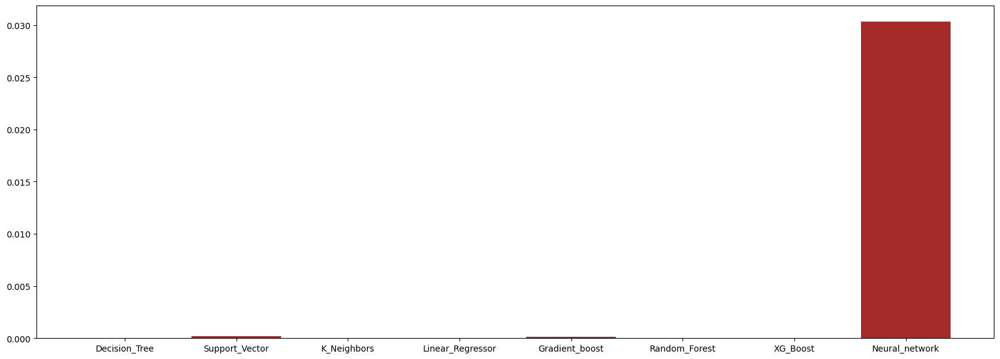

In [ ]:
plt.figure(figsize = (20, 7))
plt.bar(feat, vals, color = 'brown')

plt.show()